In [18]:
import pandas as pd
import matplotlib.pyplot as plt
import calendar
import numpy as np

In [19]:
df = pd.read_csv("../Data/PV_data_clean.csv")

C:\Users\loolz\AppData\Local\Temp\ipykernel_21284\1963208518.py:1: DtypeWarning: Columns (8,9,16,17) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv("../Data/PV_data_clean.csv")


In [20]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 35540 entries, 0 to 35539
Data columns (total 39 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   randid                    35540 non-null  object 
 1   Date                      35540 non-null  object 
 2   NOAAClimRegion            35540 non-null  object 
 3   TempZone                  35540 non-null  object 
 4   HumidZone                 35540 non-null  object 
 5   bin_PlantSize_kW          35540 non-null  object 
 6   plant_age_months          35540 non-null  float64
 7   active_snow_tickets       35540 non-null  object 
 8   snow_bin_ticket_minutes   577 non-null    object 
 9   snow_affected_assets      577 non-null    object 
 10  snow_production_level     35540 non-null  object 
 11  PR                        35540 non-null  float64
 12  snow_value_mm             35540 non-null  float64
 13  total_daily_snow_mm       35540 non-null  float64
 14  low_ir

In [21]:
# # Exploring how PR varies over time by station

# import pandas as pd

df['date'] = pd.to_datetime(df['Date'])
unique_randids = df['randid'].unique()

# # Loop through each unique 'randid' and create a plot
# for randid_value in unique_randids:
#     # Filter the DataFrame for the current 'randid'
#     station_data = df[df['randid'] == randid_value]

#     # Create the plot
#     plt.figure(figsize=(10, 6)) # Set the figure size for better readability
#     plt.plot(station_data['date'], station_data['PR'])

#     # Add labels and title
#     plt.xlabel('Date')
#     plt.ylabel('PR')
#     plt.title(f'PR over Time for Station: {randid_value}')
#     plt.grid(True) # Add a grid for better readability

#     # Improve layout to prevent labels from overlapping
#     plt.tight_layout()

#     # Close the plot to free up memory
#     plt.show()

# print("Plots have been generated and saved for each 'randid' (station).")

In [22]:
# 2. Extract Year and Month for grouping
df['year_month'] = df['date'].dt.to_period('M') # Creates a Period object (e.g., 2023-01)
df['month_num'] = df['date'].dt.month
df['year'] = df['date'].dt.year

# 3. Count readings per randid, year, and month
readings_count = df.groupby(['randid', 'year_month']).size().reset_index(name='readings_count')

# 4. Calculate total days in each month for percentage calculation
# Create a temporary DataFrame to get unique year_month combinations
unique_months = df[['year', 'month_num']].drop_duplicates()

# Function to get number of days in a month
def days_in_month(row):
    return calendar.monthrange(row['year'], row['month_num'])[1]

unique_months['total_days_in_month'] = unique_months.apply(days_in_month, axis=1)

# Merge total_days_in_month back to the readings_count DataFrame
readings_count['year'] = readings_count['year_month'].dt.year
readings_count['month_num'] = readings_count['year_month'].dt.month

readings_summary = pd.merge(readings_count, unique_months, on=['year', 'month_num'], how='left')

# 5. Calculate Percentage
readings_summary['percentage_of_month'] = (readings_summary['readings_count'] / readings_summary['total_days_in_month'] * 100).round(2)

# 6. Prepare the final table for display
# Drop auxiliary columns used for merging
readings_summary = readings_summary[['randid', 'year_month', 'readings_count', 'total_days_in_month', 'percentage_of_month']]

# Rename columns for clarity
readings_summary.rename(columns={
    'year_month': 'Month',
    'readings_count': 'Number of Readings',
    'total_days_in_month': 'Total Days in Month',
    'percentage_of_month': 'Percentage of Month (%)'
}, inplace=True)

# Sort for better readability
readings_summary.sort_values(by=['randid', 'Month'], inplace=True)

# Display the table
readings_summary.to_csv("readings_summary_raw.csv",index=False)
display(readings_summary)

,randid,Month,Number of Readings,Total Days in Month,Percentage of Month (%)
0,C2S1,2018-08,31,31,100.00
1,C2S1,2018-09,30,30,100.00
2,C2S1,2018-10,31,31,100.00
3,C2S1,2018-11,30,30,100.00
4,C2S1,2018-12,31,31,100.00
...,...,...,...,...,...
1302,P2S1,2018-12,22,31,70.97
1303,P2S1,2019-01,31,31,100.00
1304,P2S1,2019-02,28,28,100.00
1305,P2S1,2019-03,31,31,100.00


In [23]:
average_percentage_by_randid = readings_summary.groupby('randid')['Percentage of Month (%)'].mean().sort_values()
average_percentage_by_randid_df = pd.DataFrame(average_percentage_by_randid) 
average_percentage_by_randid_df

,Percentage of Month (%)
randid,
C2S59,3.23
C2S23,12.90
C2S102,29.03
C2S105,29.03
C2S125,29.03
...,...
C3S35,100.00
C3S37,100.00
C3S38,100.00


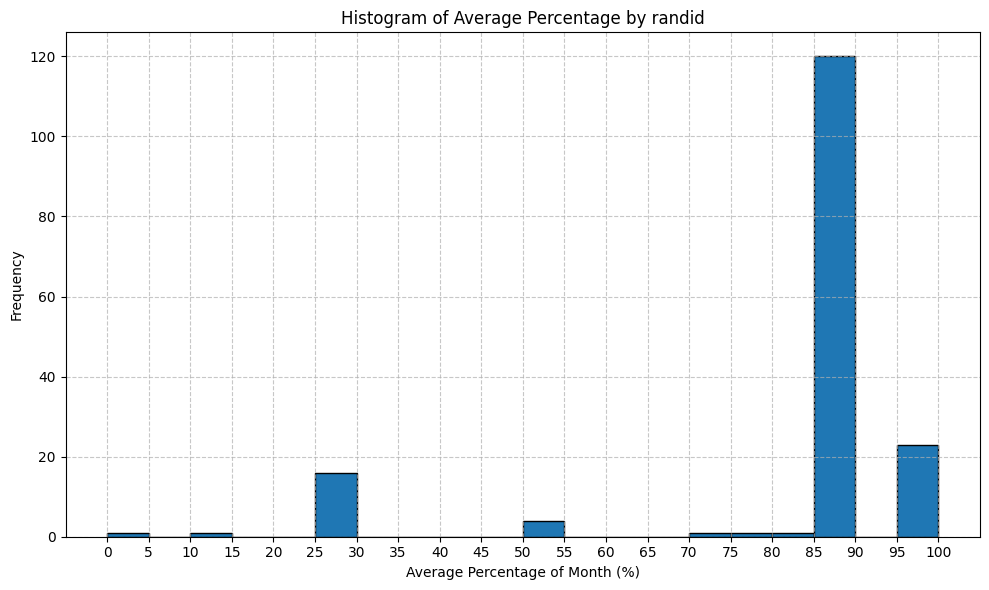

In [24]:
average_percentage_by_randid_df = average_percentage_by_randid_df.reset_index()

# Extract the percentage values
percentages = average_percentage_by_randid_df['Percentage of Month (%)']

# Define bin edges with bin size = 5%
bins = np.arange(0, 105, 5)  # from 0 to 100, step 5

# Create the histogram
plt.figure(figsize=(10, 6))
plt.hist(percentages, bins=bins, edgecolor='black')
plt.title('Histogram of Average Percentage by randid')
plt.xlabel('Average Percentage of Month (%)')
plt.ylabel('Frequency')
plt.xticks(bins)
plt.grid(True, linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()

In [25]:
# #Use df['NOAAClimRegion','randid'] to repeat histogram but by NOAACLimRegion

# joined_df = pd.merge(
#     average_percentage_by_randid_df.reset_index(),  # has 'randid' and 'Percentage of Month (%)'
#     df[['NOAAClimRegion', 'randid']],
#     on='randid',
#     how='left'
# )

# # Plot histograms by NOAAClimRegion
# regions = joined_df['NOAAClimRegion'].dropna().unique()
# num_regions = len(regions)

# # Adjust plot size based on number of regions
# fig, axs = plt.subplots(nrows=num_regions, figsize=(10, 5 * num_regions))

# # If only one region, axs won't be an array
# if num_regions == 1:
#     axs = [axs]

# for ax, region in zip(axs, regions):
#     region_data = joined_df[joined_df['NOAAClimRegion'] == region]['Percentage of Month (%)']
#     ax.hist(region_data, bins=bins, edgecolor='black')
#     ax.set_title(f'Histogram for {region}')
#     ax.set_xlabel('Average Percentage of Month (%)')
#     ax.set_ylabel('Frequency')
#     ax.set_xticks(bins)
#     ax.grid(True, linestyle='--', alpha=0.7)

# plt.tight_layout()
# plt.show()


In [26]:
#It looks like the stations with low reporting rates are evenly distributed by Climate Region. Hence, we can remove them from the data and test the PR over time graphs again
PR_THRESHOLD = 85

stations_to_keep = average_percentage_by_randid_df[average_percentage_by_randid_df['Percentage of Month (%)']>PR_THRESHOLD]['randid']
df_filtered = df[df['randid'].isin(stations_to_keep)]

C:\Users\loolz\AppData\Local\Temp\ipykernel_21284\854818130.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_filtered['date'] = pd.to_datetime(df_filtered['Date'])


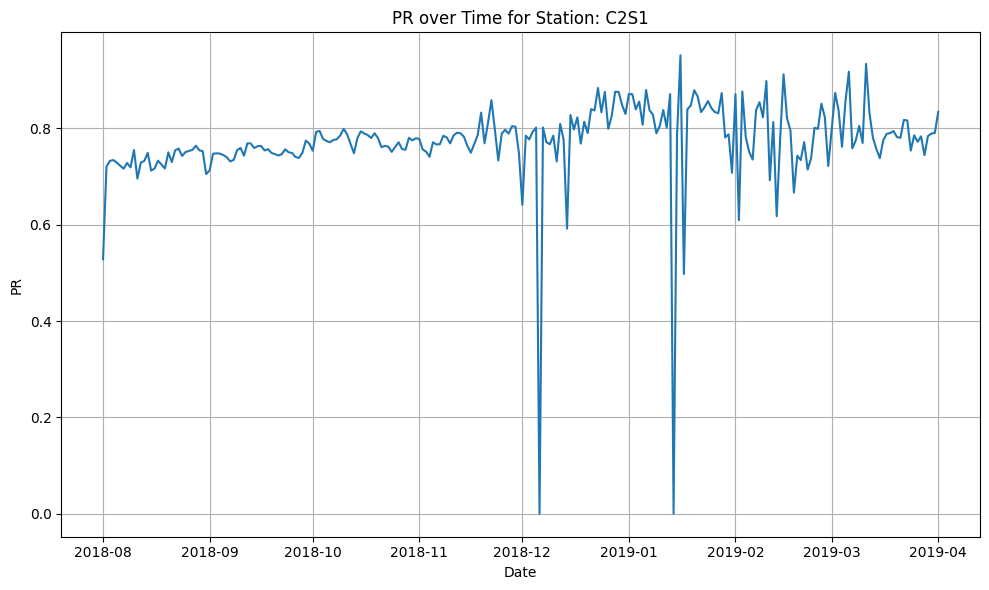

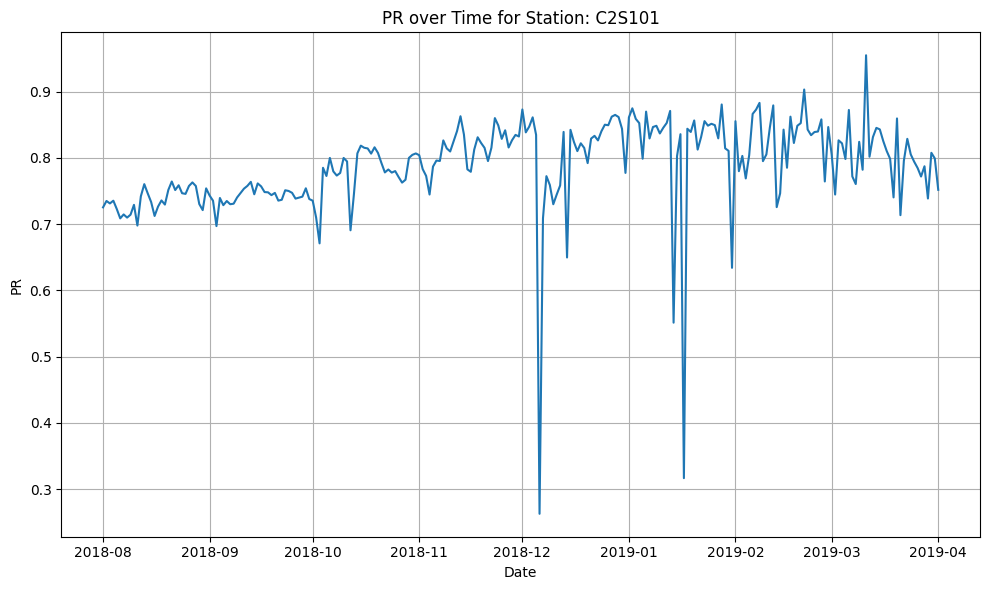

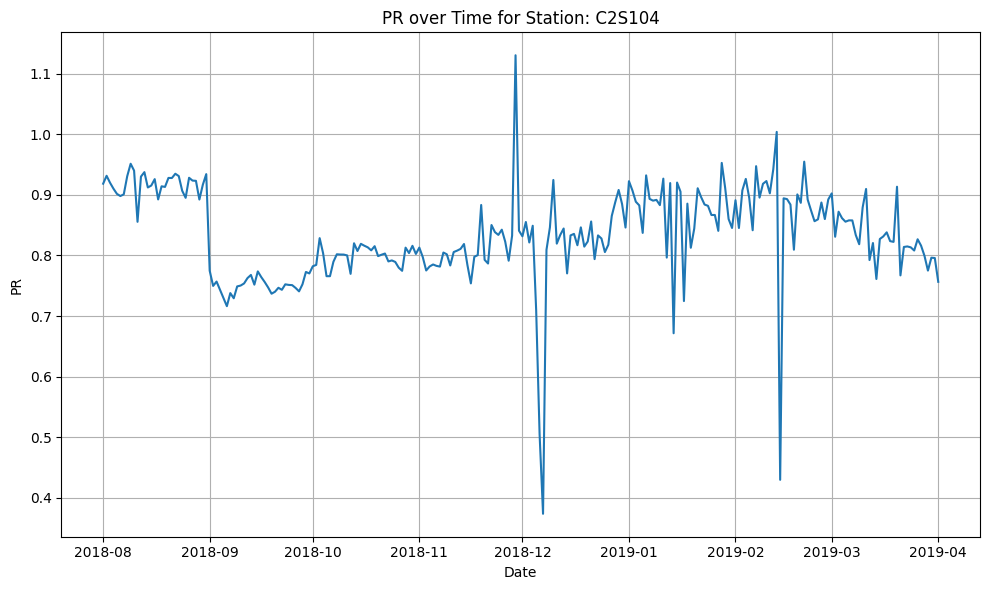

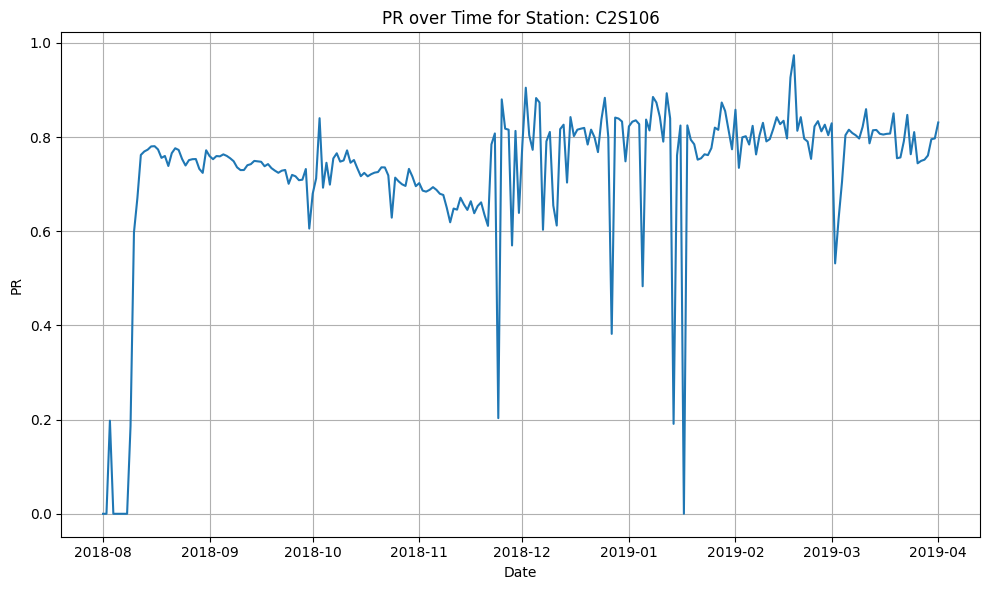

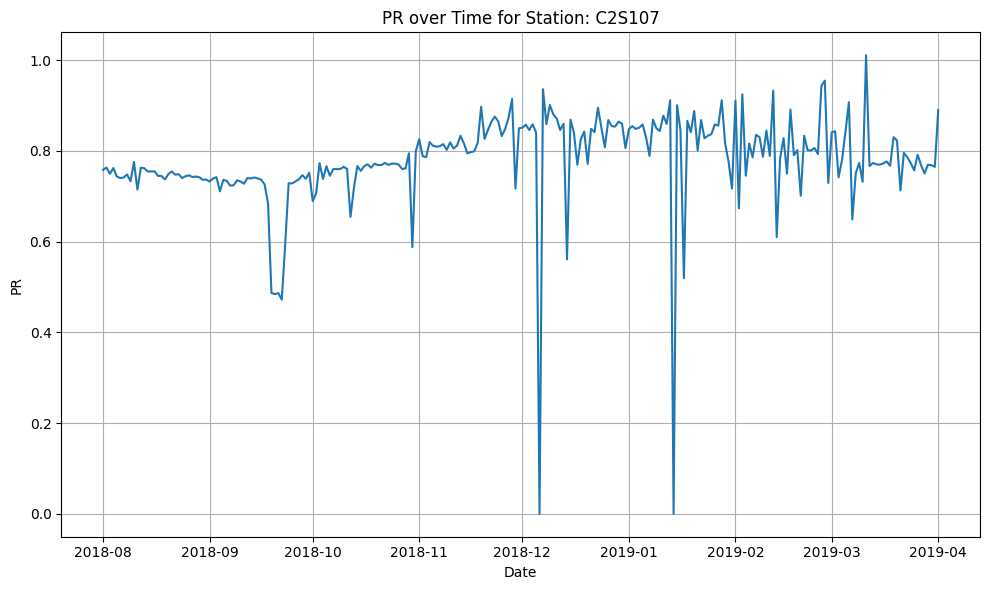

...

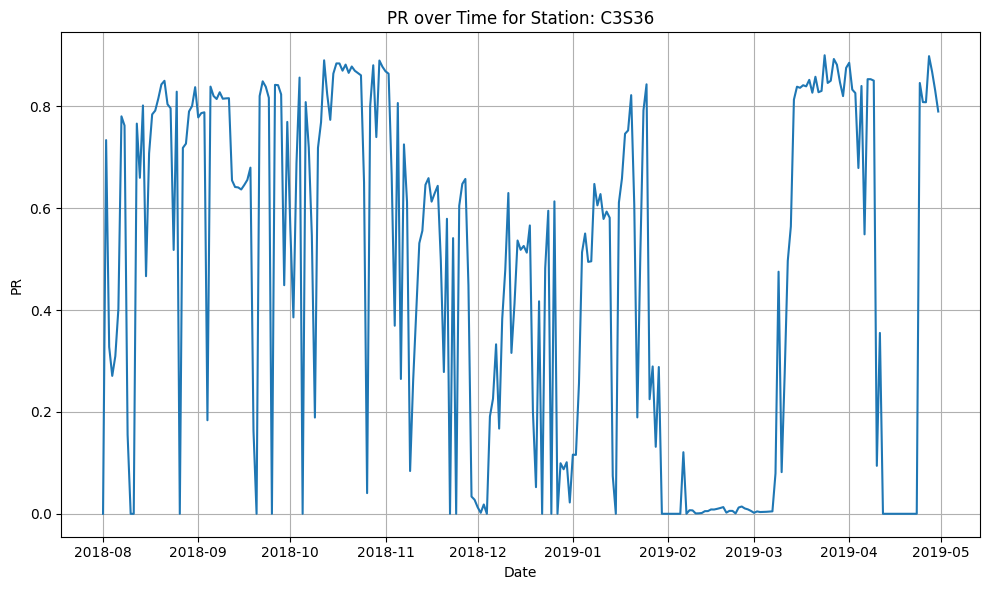

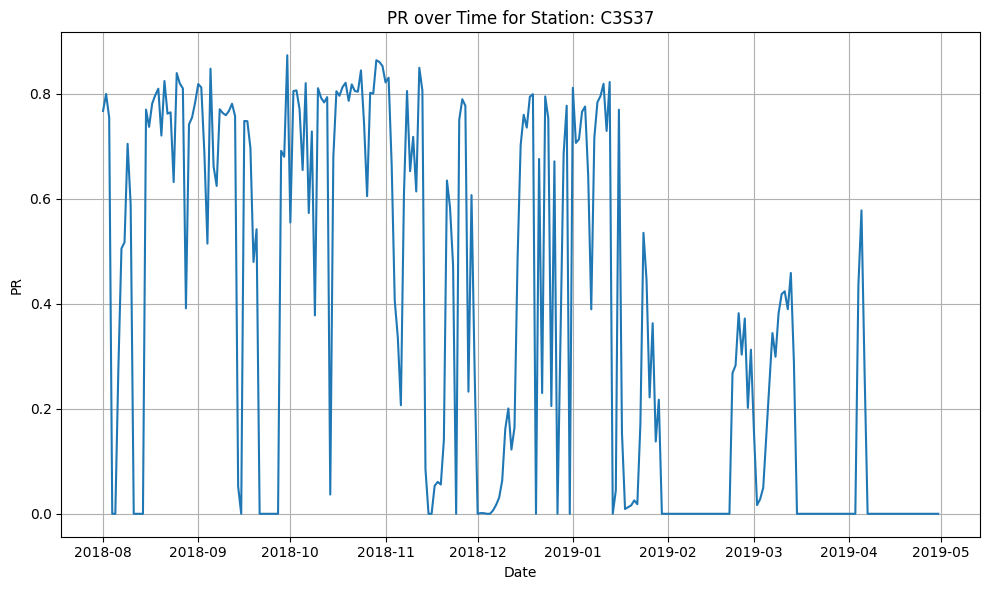

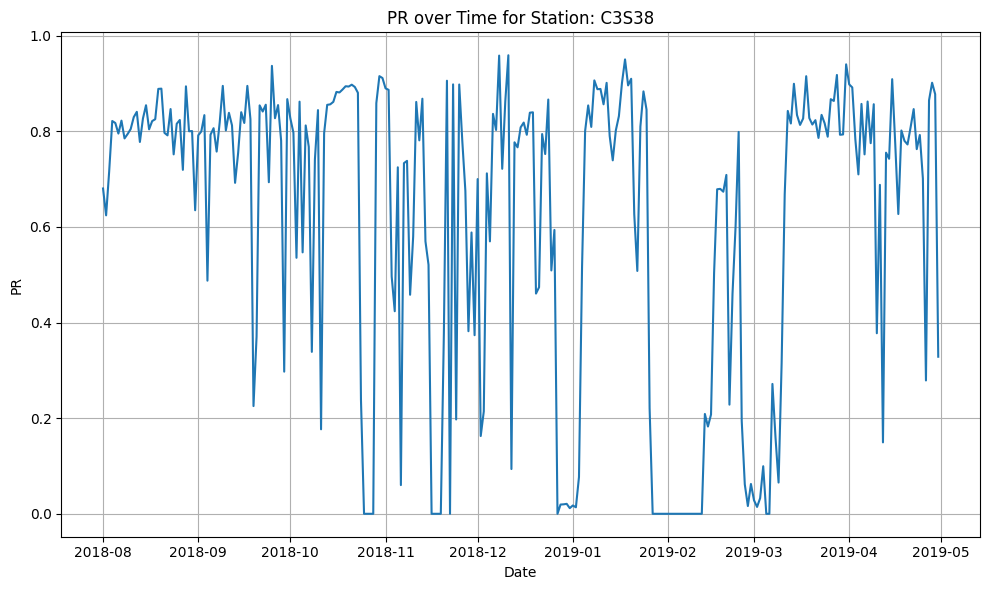

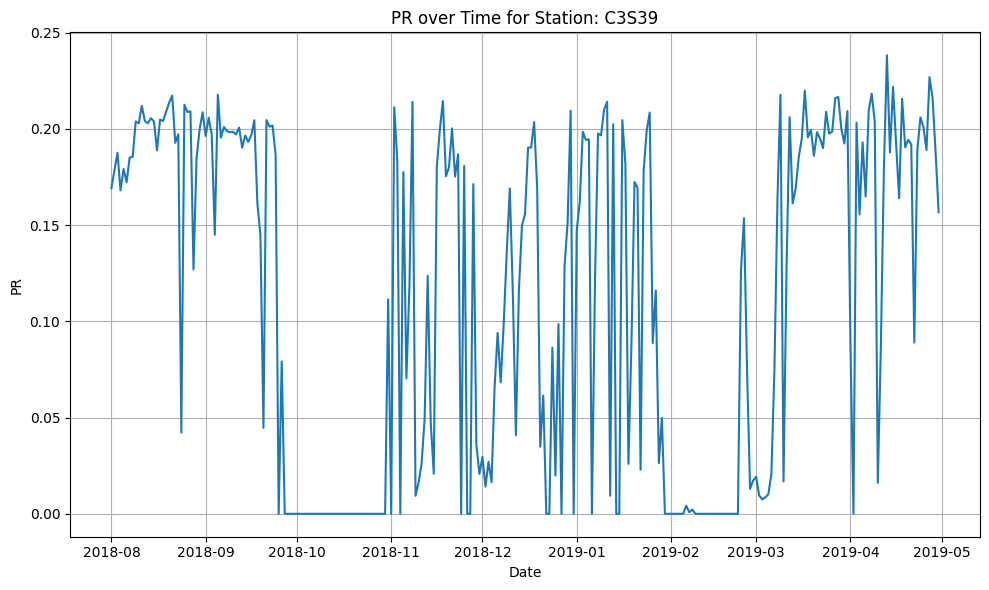

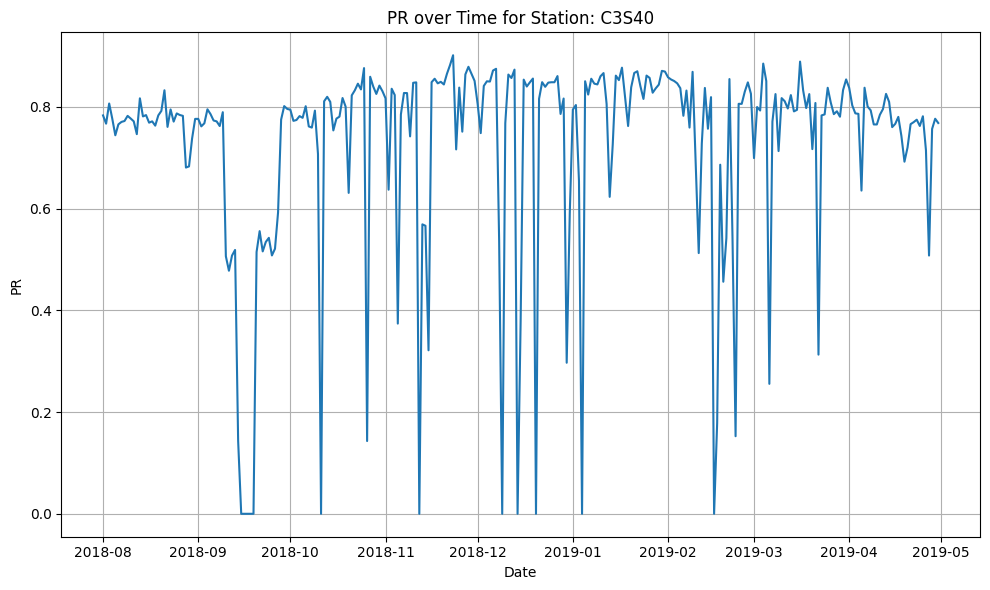

Plots have been generated and saved for each 'randid' (station).


In [27]:
# Repeating the PR graphs over time by station

df_filtered['date'] = pd.to_datetime(df_filtered['Date'])
unique_randids = df_filtered['randid'].unique()

# Loop through each unique 'randid' and create a plot
for randid_value in unique_randids:
    # Filter the DataFrame for the current 'randid'
    station_data = df_filtered[df_filtered['randid'] == randid_value]

    # Create the plot
    plt.figure(figsize=(10, 6))  # Set the figure size for better readability
    plt.plot(station_data['date'], station_data['PR'])

    # Add labels and title
    plt.xlabel('Date')
    plt.ylabel('PR')
    plt.title(f'PR over Time for Station: {randid_value}')
    plt.grid(True)  # Add a grid for better readability

    # Improve layout to prevent labels from overlapping
    plt.tight_layout()

    # Show the plot
    plt.show()

print("Plots have been generated and saved for each 'randid' (station).")
